In [1]:
#%load_ext tensorboard

from Source.utils import *
from Source.unet import Unet
import matplotlib as mpl
import torch
import matplotlib.pyplot as plt
mpl.rcParams['animation.embed_limit'] = 2**128

# Settings for plots
fontsiz = 15
mpl.rcParams.update({'font.size': fontsiz})
mpl.rcParams['xtick.labelsize'] = fontsiz
mpl.rcParams['ytick.labelsize'] = fontsiz
mpl.rcParams['xtick.major.size'] = fontsiz/2
mpl.rcParams['ytick.major.size'] = fontsiz/2

# Helper functions for visualization.
%matplotlib inline
from IPython.display import HTML
#from IPython.display import Javascript  # Restrict height of output cell.
#display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 300})'''))
display(HTML("<style>.container { width:100% !important; }</style>"))

2.0.0+cu117
CUDA Available
Using normalized force and torque
Rotation data augmentation: True
Min learning rate: 1.0e-07
Max learning rate: 1.0e-04
Noise std: 1.0e-03
Use torque: True
Use equivariant net: True
Batch size: 128
Linking radius 0.055
Hidden channels 64
Graph layers 3
Using throttle, steering and braking: False
Using wheel type embedding: True
Using bottom boundary distance: False
Num tire nodes: 375
Using sinkage: True
Using velocity: True
Using cosine loss: False
Random drop rate: 0.0
Using normalization layers: None
Using AMP: False
Using cnn hmap: False
Using wheel nodes: False
Using use rel pos wheel: True
Using log True
Using normalization True
Using rollouts False , Rollout lenght: 50


In [2]:
nsims = 1
pathvalid = "/home/tda/CARLA/chrono_scm_newcode/scm_analysis/Outs3"
#pathvalid = "/home/tda/Descargas/SCM_simulations/DefSimsNoDamp/Train"
dataset = load_chrono_dataset(pathsims=pathvalid, numsims=nsims, firsttimestep = 0, maxtimesteps = 2500, split_steps=True)
dataset = dataset[:len(dataset)//4]
#dataset = dataset[:250]

Loading simulations from: /home/tda/CARLA/chrono_scm_newcode/scm_analysis/Outs3
Loading:  /home/tda/CARLA/chrono_scm_newcode/scm_analysis/Outs3/POLARIS_SCM_scm_flat_throttle_1.00_steering_0.00_initheight_0.10_tend_5.00

Num sims 1
Total num bursts 9996


In [3]:
input_channels = 3
global_emb_dim = 6

model = Unet(input_channels = input_channels,
             num_layers = n_layers,
             hidden_channels_in = hidden_channels,
             global_emb_dim = global_emb_dim)

deltastep = 1
n_sims = None
dataname = "DefSimsNoDamp"

namerun = "unet_"
namerun += dataname
namerun += "_test13"
namerun += "_deltastep_"+str(deltastep)
namerun += "_nsims_"+str(n_sims)
if use_log:
    namerun += "_log"
else:
    namerun += "_lin"
namerun += "_lrfact_{:.1e}".format(lr_fact)
namerun += "_gridsize_{:d}".format(sizegrid)
if use_rollout:
    namerun += "_rollout_"+str(rol_len)
else:
    namerun += "_singlestep"
namerun += "_margin_{:.1e}".format(margin)    

namerun += "_lays_{:d}_std_{:.1e}_chan_{:d}_batch_{:d}".format(n_layers, noise_std, hidden_channels, batch_size)
namerun += "_inputs_{:d}_globdim_{:d}".format(input_channels, global_emb_dim)

if use_wheeltype:
    namerun += "_wheeltype"

sufix = "_"+namerun+"_lrs_{:.1e}_{:.1e}".format(lr_min, lr_max)

bestmodelname = path+"models/bestmodel"+sufix
#bestmodelname = path+"models/bestrigmodel"+sufix
#bestmodelname = path+"models/lastmodel"+sufix
state_dict = torch.load(bestmodelname, map_location=device)
model.load_state_dict(state_dict)
print(bestmodelname)
#"""
model.to(device)
model.eval()

models/bestmodel_unet_DefSimsNoDamp_test13_deltastep_1_nsims_None_log_lrfact_1.0e+00_gridsize_12_singlestep_margin_3.0e-02_lays_3_std_1.0e-03_chan_64_batch_128_inputs_3_globdim_6_wheeltype_lrs_1.0e-07_1.0e-04


Unet(
  (global_mlp): Sequential(
    (0): Linear(in_features=6, out_features=6, bias=True)
    (1): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (global_mlp): Linear(in_features=6, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (global_mlp): Linear(in_features=6, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(256, 256, kernel_size=(4, 4), str

In [4]:
import matplotlib.animation as animation

def animate_func(i, im, snapshots):
        #if i % fps == 0:
        #    print( '.', end ='' )

        for j in range(snapshots.shape[1]):
            im[j].set_array(snapshots[i,j])

        return im

def get_hist(snapshots):
    
    if use_log:
        
        bins = np.linspace(-8,0,100)
        
        plt.hist(snapshots[:,3].reshape(-1), bins, density=False, color="r", alpha=0.5, label="True")
        plt.hist(snapshots[:,4].reshape(-1), bins, density=False, color="b", alpha=0.5, label="Predicted")
        
        plt.xlabel("log(Deformation [m])")
        
    else:
        
        bins = np.linspace(0, 0.01,10000)
        
        plt.hist(np.abs(snapshots[:,3].reshape(-1)), bins, density=False, color="r", alpha=0.5, label="True")
        plt.hist(np.abs(snapshots[:,4].reshape(-1)), bins, density=False, color="b", alpha=0.5, label="Predicted")
        
        plt.xscale("log")
        plt.xlabel("Deformation [m]")
    
    plt.yscale("log")
    
    plt.ylabel("Frequency")
    plt.grid()
    plt.legend()
    plt.show()

    
def video_hmap(dataset, model = None):
    
    fps = 25
    
    snapshots = torch.cat([ torch.cat([data.in_hmap, data.def_true],dim=1) for data in dataset ],dim=0)
    glob = torch.cat([ data.glob for data in dataset ],dim=0)
    
    #print(snapshots.shape, glob.shape)
    
    if model is not None:
        
        outputs = torch.cat([ model(data.in_hmap.to(device), data.glob.to(device)) for data in dataset ],dim=0).cpu()
        if use_log:
            outputs = -torch.exp(outputs)
            #snapshots[:,3] = torch.log(-torch.clamp(snapshots[:,3],max=0.) + 1.e-8)
        snapshots = torch.cat([snapshots, outputs],dim=1)
        
    snapshots[:,3:5] = torch.log10(-torch.clamp(snapshots[:,3:5],max=0.) + 1.e-8)
    snapshots = snapshots.detach().numpy()
        
    if model is not None:
        get_hist(snapshots)
        
    n_channels = snapshots.shape[1]
    minvalue = [snapshots[:,i].min() for i in range(n_channels)]
    maxvalue = [snapshots[:,i].max() for i in range(n_channels)]
    
    fig, axes = plt.subplots(1,n_channels, figsize=(n_channels*4,4) )

    axes[0].set_title("Relative height")
    axes[1].set_title("Relative distance")
    axes[2].set_title("Sinkage")
    axes[3].set_title("True deformation")
    if n_channels>4:
        axes[4].set_title("Out deformation")
        minvalue[4] = minvalue[3]  # same max and min values for predicted and true deformation
        maxvalue[4] = maxvalue[3]

    
        
    im = []

    for j in range(n_channels):
        im.append(axes[j].imshow(snapshots[0,j], interpolation='none', aspect='auto', vmin=minvalue[j], vmax=maxvalue[j]))

    #"""
    anim = animation.FuncAnimation(fig, 
                                   lambda i: animate_func(i,im,snapshots), 
                                   frames = snapshots.shape[0],
                                   interval = 1000 / fps, # in ms
                                   )
    display(HTML(anim.to_html5_video()))
    plt.close()
    #"""

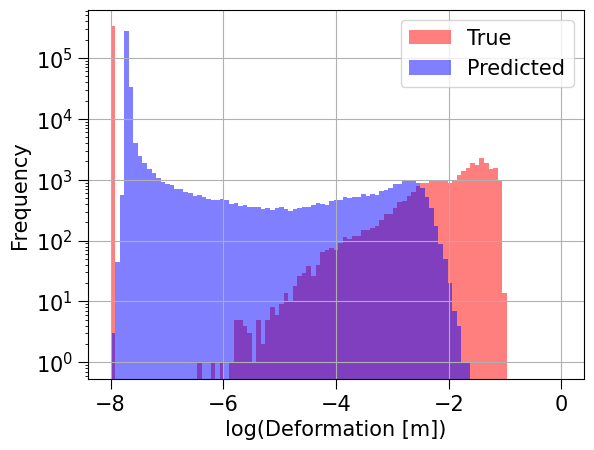

In [5]:
#video_hmap(dataset)
video_hmap(dataset,model)